In [1]:
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/kaggle/input/malarial-cell-image/Malarial Cell Image Data /malarial_cell_image_data/cell_images/Uninfected/C203ThinF_IMG_20151029_102123_cell_51.png
/kaggle/input/malarial-cell-image/Malarial Cell Image Data /malarial_cell_image_data/cell_images/Uninfected/C238NThinF_IMG_20151207_114038_cell_84.png
/kaggle/input/malarial-cell-image/Malarial Cell Image Data /malarial_cell_image_data/cell_images/Uninfected/C119P80ThinF_IMG_20151002_124304_cell_112.png
/kaggle/input/malarial-cell-image/Malarial Cell Image Data /malarial_cell_image_data/cell_images/Uninfected/C39P4thinF_original_IMG_20150622_111723_cell_33.png
/kaggle/input/malarial-cell-image/Malarial Cell Image Data /malarial_cell_image_data/cell_images/Uninfected/C101P62ThinF_IMG_20150918_151149_cell_63.png
/kaggle/input/malarial-cell-image/Malarial Cell Image Data /malarial_cell_image_data/cell_images/Uninfected/C180P141NThinF_IMG_20151201_165601_cell_115.png
/kaggle/input/malarial-cell-image/Malarial Cell Image Data /malarial_cell_im

## Importing Libraries

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import os
import cv2

from PIL import Image

from tensorflow import keras
import tensorflow.keras.layers as k

# Shows the progress
from tqdm.notebook import tqdm

2024-01-30 18:47:08.857990: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-01-30 18:47:08.858286: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-01-30 18:47:09.097163: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


## Data

In [3]:
from keras.preprocessing.image import ImageDataGenerator, load_img

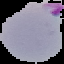

In [4]:
# Parasitized
# Reducing img dimension to 64*64
load_img("/kaggle/input/malarial-cell-image/Malarial Cell Image Data /cell_images/Parasitized/C181P142ThinF_IMG_20151127_160650_cell_185.png",target_size=(64,64))

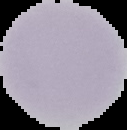

In [5]:
# Uninfected
load_img("/kaggle/input/malarial-cell-image/Malarial Cell Image Data /cell_images/Uninfected/C188P149ThinF_IMG_20151203_134229_cell_2.png")

In [6]:
# Defining keras backend
os.environ['KERAS_BACKEND'] = 'tensorflow'
np.random.seed(101)

In [7]:
# Setting image dir and image size
image_dir = '/kaggle/input/malarial-cell-image/Malarial Cell Image Data /malarial_cell_image_data/cell_images/'
size = 64
dataset = []
label   = []

In [8]:
parasitized_img = os.listdir(image_dir+"Parasitized/")
parasitized_img = parasitized_img[:3000]
# enumerate : along with list element add counter to it
for i,img_name in enumerate(tqdm(parasitized_img)):
    if (img_name.split('.')[1] == 'png'):
        # Reading image as a numpy array with the help of open cv
        image = cv2.imread(image_dir+"Parasitized/"+img_name)
        # Converting into image format
        image = Image.fromarray(image,'RGB')
        image = image.resize((size,size))
        
        # Appending images to dataset
        dataset.append(np.array(image))
        # Assigning label as '0' for all the parasi
        label.append(0)

  0%|          | 0/3000 [00:00<?, ?it/s]

In [9]:
uninfected_img = os.listdir(image_dir+"Uninfected/")
uninfected_img = uninfected_img[:3000]
# enumerate : along with list element add counter to it
for i,img_name in enumerate(tqdm(uninfected_img)):
    if (img_name.split('.')[1] == 'png'):
        # Reading image as a numpy array with the help of open cv
        image = cv2.imread(image_dir+"Uninfected/"+img_name)
        # Converting into image format
        image = Image.fromarray(image,'RGB')
        image = image.resize((size,size))
        
        # Appending images to dataset
        dataset.append(np.array(image))
        # Assigning label as '0' for all the parasi
        label.append(1)

  0%|          | 0/3000 [00:00<?, ?it/s]

In [10]:
len(uninfected_img)

3000

In [11]:
len(parasitized_img)

3000

In [12]:
from sklearn.model_selection import train_test_split
from keras.utils import to_categorical

x_train,x_test,y_train,y_test = train_test_split(dataset,to_categorical(np.array(label)),test_size=0.2,random_state=0)

## CNN Model Architecture

In [13]:
INPUT_SHAPE = (size,size,3)
# Creating input layer
inp = k.Input(shape = INPUT_SHAPE)
              
# Defining convolutional layer 
conv1 = k.Conv2D(32,kernel_size = (3,3), activation = 'relu',padding = 'same')(inp)
# Pooling layer
pool1 = k.MaxPool2D(pool_size = (2,2))(conv1)
# Normalizing for uniformity in data
norm1 = k.BatchNormalization(axis = -1)(pool1)
drop1 = k.Dropout(rate=0.2)(norm1)

# Input to conv2 will be from previous layer i.e drop1
conv2 = k.Conv2D(32,kernel_size = (3,3), activation = 'relu',padding = 'same')(drop1)
pool2 = k.MaxPool2D(pool_size = (2,2))(conv2)
norm2 = k.BatchNormalization(axis = -1)(pool2)
drop2 = k.Dropout(rate=0.2)(norm2)

# Flattening 
flat = k.Flatten()(drop2)

# Defining layers within fully connected layer
hidden1 = k.Dense(512,activation = 'relu')(flat)
norm3 = k.BatchNormalization(axis = -1)(hidden1)
drop3 = k.Dropout(rate = 0.2)(norm3)
              
hidden2 = k.Dense(256,activation = 'relu')(drop3)
norm4 = k.BatchNormalization(axis = -1)(hidden2)
drop4 = k.Dropout(rate = 0.2)(norm4)

# In output layer, we need two neurons (for 'uninfected','paratisized')
out = k.Dense(2,activation='sigmoid')(drop4)

In [14]:
model = keras.Model(inputs = inp, outputs = out)
model.compile(optimizer ='adam',
              loss = 'categorical_crossentropy',
              metrics=['accuracy'])

print(model.summary())

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 64, 64, 3)]       0         
                                                                 
 conv2d (Conv2D)             (None, 64, 64, 32)        896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 32, 32, 32)        0         
 D)                                                              
                                                                 
 batch_normalization (Batch  (None, 32, 32, 32)        128       
 Normalization)                                                  
                                                                 
 dropout (Dropout)           (None, 32, 32, 32)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 32, 32, 32)        9248  

In [15]:
history = model.fit(np.array(x_train),y_train,
                    # Keep 10% data for validation
                   batch_size = 64, verbose = 1, epochs = 5,validation_split=0.1)

Epoch 1/5
68/68 [==============================] - 18s 230ms/step - loss: 0.8164 - accuracy: 0.6317 - val_loss: 1.7499 - val_accuracy: 0.5562
Epoch 2/5
68/68 [==============================] - 15s 214ms/step - loss: 0.6049 - accuracy: 0.7019 - val_loss: 3.4327 - val_accuracy: 0.5000
Epoch 3/5
68/68 [==============================] - 15s 226ms/step - loss: 0.4757 - accuracy: 0.7778 - val_loss: 2.1841 - val_accuracy: 0.5500
Epoch 4/5
68/68 [==============================] - 15s 217ms/step - loss: 0.3341 - accuracy: 0.8609 - val_loss: 2.2662 - val_accuracy: 0.5979
Epoch 5/5
68/68 [==============================] - 15s 223ms/step - loss: 0.2539 - accuracy: 0.8977 - val_loss: 1.8817 - val_accuracy: 0.6646


In [16]:
print('Test_Accuracy:{:2f}%'.format(model.evaluate(np.array(x_test),np.array(y_test))[1]*100))

38/38 [==============================] - 1s 27ms/step - loss: 1.9637 - accuracy: 0.6842
Test_Accuracy:68.416667%


## Visualising Data

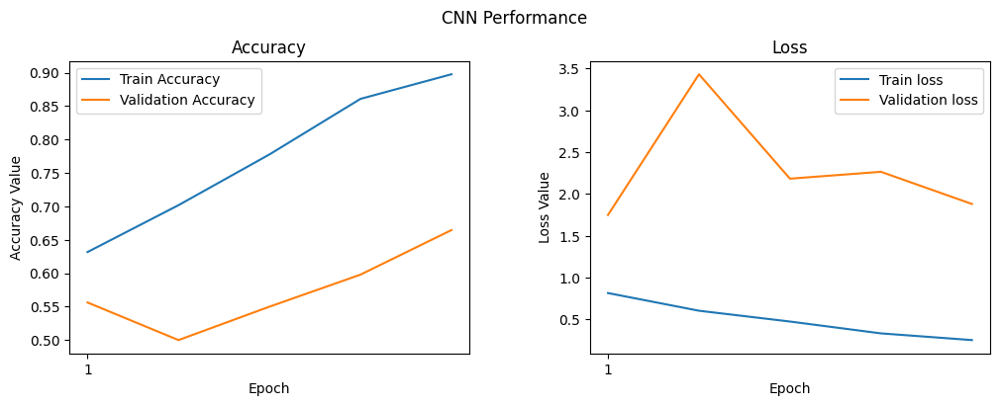

In [17]:
f, (ax1,ax2) = plt.subplots(1,2,figsize=(12,4))
t = f.suptitle('CNN Performance',fontsize=12)
f.subplots_adjust(top=0.85,wspace=0.3)

# 1st subplot for training accuracy
max_epoch = len(history.history['accuracy']) + 1
epoch_list = list(range(1,max_epoch))
ax1.plot(epoch_list,history.history['accuracy'],label='Train Accuracy')
ax1.plot(epoch_list,history.history['val_accuracy'],label='Validation Accuracy')
ax1.set_xticks(np.arange(1,max_epoch,5))
ax1.set_ylabel('Accuracy Value')
ax1.set_xlabel('Epoch')
ax1.set_title('Accuracy')
l1 = ax1.legend(loc='best')

# 2nd suplot for Validation loss
ax2.plot(epoch_list,history.history['loss'],label='Train loss')
ax2.plot(epoch_list,history.history['val_loss'],label='Validation loss')
ax2.set_xticks(np.arange(1,max_epoch,5))
ax2.set_ylabel('Loss Value')
ax2.set_xlabel('Epoch')
ax2.set_title('Loss')
l2 = ax2.legend(loc='best')


## Using tensorflow to prepare model architecture

In [18]:
from tensorflow.keras.layers import Convolution2D, MaxPooling2D, Flatten, Dense, BatchNormalization, Dropout
from tensorflow.keras.models import Sequential

model = None
model = Sequential()
model.add(Convolution2D(32,(3,3),input_shape=(size,size,3),activation='relu',data_format='channels_last'))
model.add(MaxPooling2D(pool_size=(2,2),data_format='channels_last'))
model.add(BatchNormalization(axis=-1))
model.add(Dropout(0.2))

model.add(Convolution2D(32,(3,3),activation='relu'))
model.add(MaxPooling2D(pool_size=(2,2),data_format='channels_last'))
model.add(BatchNormalization(axis=-1))
model.add(Dropout(0.2))

model.add(Flatten())
model.add(Dense(activation='relu',units=512))
model.add(BatchNormalization(axis=-1))
model.add(Dropout(0.2))

model.add(Dense(activation='relu',units=256))
model.add(BatchNormalization(axis=-1))
model.add(Dropout(0.2))

model.add(Dense(activation='sigmoid',units=2))

model.compile(optimizer='adam',loss='categorical_crossentropy',metrics=['accuracy'])
print(model.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_2 (Conv2D)           (None, 62, 62, 32)        896       
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 31, 31, 32)        0         
 g2D)                                                            
                                                                 
 batch_normalization_4 (Bat  (None, 31, 31, 32)        128       
 chNormalization)                                                
                                                                 
 dropout_4 (Dropout)         (None, 31, 31, 32)        0         
                                                                 
 conv2d_3 (Conv2D)           (None, 29, 29, 32)        9248      
                                                                 
 max_pooling2d_3 (MaxPoolin  (None, 14, 14, 32)        0

In [19]:
print('Test_Accuracy:{:2f}%'.format(model.evaluate(np.array(x_test),np.array(y_test))[1]*100))

38/38 [==============================] - 1s 24ms/step - loss: 17.7557 - accuracy: 0.4742
Test_Accuracy:47.416666%


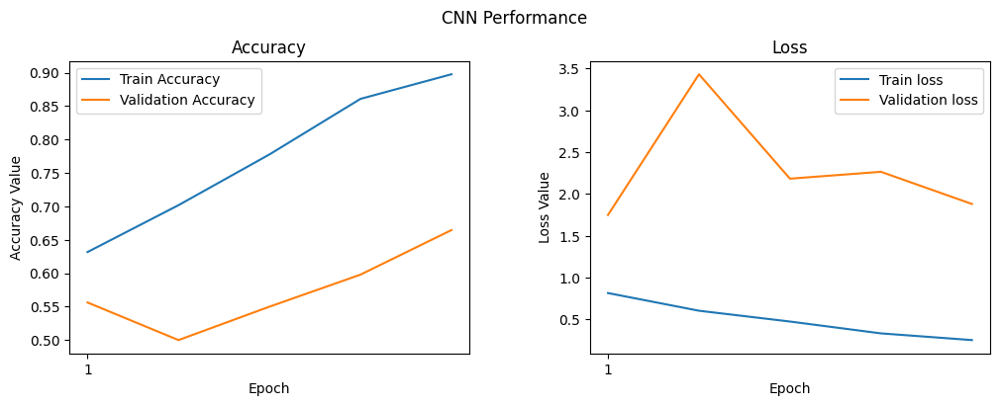

In [20]:
f, (ax1,ax2) = plt.subplots(1,2,figsize=(12,4))
t = f.suptitle('CNN Performance',fontsize=12)
f.subplots_adjust(top=0.85,wspace=0.3)

# 1st subplot for training accuracy
max_epoch = len(history.history['accuracy']) + 1
epoch_list = list(range(1,max_epoch))
ax1.plot(epoch_list,history.history['accuracy'],label='Train Accuracy')
ax1.plot(epoch_list,history.history['val_accuracy'],label='Validation Accuracy')
ax1.set_xticks(np.arange(1,max_epoch,5))
ax1.set_ylabel('Accuracy Value')
ax1.set_xlabel('Epoch')
ax1.set_title('Accuracy')
l1 = ax1.legend(loc='best')

# 2nd suplot for Validation loss
ax2.plot(epoch_list,history.history['loss'],label='Train loss')
ax2.plot(epoch_list,history.history['val_loss'],label='Validation loss')
ax2.set_xticks(np.arange(1,max_epoch,5))
ax2.set_ylabel('Loss Value')
ax2.set_xlabel('Epoch')
ax2.set_title('Loss')
l2 = ax2.legend(loc='best')